In [1]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

import cv2
import glob
from skimage.metrics import structural_similarity as ssim
from sewar.full_ref import rmse, psnr, uqi

# Import helper functions from utils.py
import utils
import importlib
importlib.reload(utils)

# Save path
save_path = r"E:\SNU Chennai\projects\IVP\edge-detection-metrics\Evaluation metrics"

# Global variables
channels = ['Coastal \nAerosol','Blue','Green',
            'Red','Red Edge 1','Red Edge 2',
            'Red Edge 3','NIR','Red Edge 4',
            'Water \nVapour','SWIR 1','SWIR 2']

# Thresholds (same as Sobel for consistency)
prewitt_thresholds = [50, 100, 150, 200, 250, 300]

# Test image paths
test_path = glob.glob(r"E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\*")
print(test_path[0])
print(len(test_path))

# Initialise processor
processor = utils.data_processor()


E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20190312T031541_N0211_R118_T48QYJ_20190312T083550_image_0_0.tif
98


In [2]:
# Load input data
def get_input(paths):
    input = []
    rgb = []
    labels = []

    for path in paths:
        try:
            img, rgb_img, label = processor.load_test(path)
            input.append(img)
            labels.append(label)
            rgb.append(rgb_img)
        except:
            print("Error with image: ", path)

    # Convert binary label to edge reference using Canny (fixed reference for evaluation)
    canny_input = [np.uint8(img * 255) for img in labels]
    edge_reference = [np.uint8(cv2.Canny(img, threshold1=100, threshold2=200)) for img in canny_input]

    return input, rgb, labels, edge_reference

input, rgb, labels, edge_reference = get_input(test_path)


c:\Users\sreen\anaconda3\envs\gdalpip\Lib\site-packages\osgeo\gdal.py:311: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


Random check index: 36


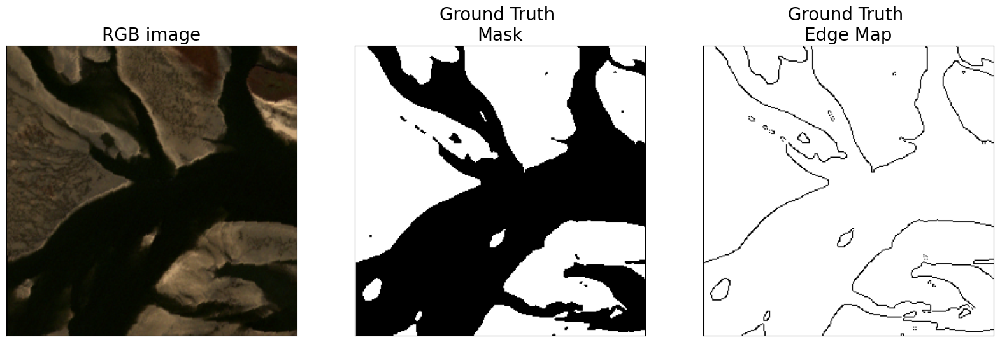

In [3]:
# Visual check of a sample image
rint = np.random.randint(0, len(edge_reference))
print("Random check index:", rint)

fig, ax = plt.subplots(1, 3, figsize=(20, 20))
fig.set_facecolor('white')

ax[0].imshow(rgb[rint])
ax[0].set_title('RGB image', size=20)
ax[1].imshow(1 - labels[rint], cmap='gray')
ax[1].set_title('Ground Truth \nMask', size=20)
ax[2].imshow(255 - edge_reference[rint], cmap='gray')
ax[2].set_title('Ground Truth \nEdge Map', size=20)

for a in ax:
    a.set_xticks([])
    a.set_yticks([])

plt.savefig(save_path + '\\Figures\\prewitt_dataset_example.png', dpi=300, bbox_inches='tight')


In [4]:
# Apply Prewitt edge detection with thresholding
def get_prewitt(input_images):
    prewitt_input = input_images.copy()
    prewitt = {}

    for thresh in prewitt_thresholds:
        results = []
        for img in prewitt_input:
            prewitt_img = processor.preprocess(img)  # normalize each band
            out = np.zeros_like(prewitt_img)
            for i in range(12):  # 12 bands
                band = prewitt_img[:, :, i]
                prewitt_band = processor.prewitt_ed(band)
                _, binary = cv2.threshold(prewitt_band, thresh, 255, cv2.THRESH_BINARY)
                out[:, :, i] = binary
            results.append(out)
        prewitt[str(thresh)] = results
        print(f"Threshold {thresh}: {len(results)} images processed.")
    return prewitt

# Run Prewitt
prewitt = get_prewitt(input)


Threshold 50: 98 images processed.
Threshold 100: 98 images processed.
Threshold 150: 98 images processed.
Threshold 200: 98 images processed.
Threshold 250: 98 images processed.
Threshold 300: 98 images processed.


In [5]:
# Evaluate Prewitt outputs
rows = []

for threshold in prewitt_thresholds:
    prewitt_output = prewitt[str(threshold)]

    for i, output in enumerate(prewitt_output):
        ref_img = edge_reference[i]
        ID = i

        for j in range(len(channels)):
            img = output[:, :, j]

            # Evaluation metrics
            rmse_ = rmse(ref_img, img)
            psnr_ = psnr(ref_img, img)
            uqi_ = uqi(ref_img, img)
            ssim_ = ssim(ref_img, img, multichannel=True)
            fom_ = processor.fom(ref_img, img)
            tp_, fp_, tn_, fn_, tpr_, fpr_, tnr_, fnr_, fp_fn_ratio_ = processor.get_rates(ref_img, img)
            pde_ = np.count_nonzero(img) / np.count_nonzero(ref_img)

            row = [ID, threshold, j + 1, rmse_, psnr_, uqi_, ssim_, fom_,
                   tp_, fp_, tn_, fn_, tpr_, fpr_, tnr_, fnr_, fp_fn_ratio_, pde_]
            rows.append(row)

    print(f"Threshold {threshold} done")

# Save to CSV
df_metrics_prewitt = pd.DataFrame(rows, columns=[
    'ID', "thresholds", "band", "rmse", "psnr", "uqi", "ssim", "fom",
    "tp", "fp", "tn", "fn", "tpr", "fpr", "tnr", "fnr", "fp_fn_ratio", "pde"
])

df_metrics_prewitt.to_csv(save_path + "\\prewitt_evaluation_metrics.csv", index=False)
df_metrics_prewitt.head()

Threshold 50 done
Threshold 100 done
Threshold 150 done
Threshold 200 done
Threshold 250 done
Threshold 300 done


,ID,thresholds,band,rmse,psnr,uqi,ssim,fom,tp,fp,tn,fn,tpr,fpr,tnr,fnr,fp_fn_ratio,pde
0,0,50,1,62.927587,12.153982,0.682087,0.698965,0.398447,186,1747,61359,2244,0.076543,0.027684,0.972316,0.923457,0.778520,0.795473
1,0,50,2,63.351876,12.095614,0.671273,0.689001,0.453293,283,1898,61208,2147,0.116461,0.030076,0.969924,0.883539,0.884024,0.897531
2,0,50,3,65.492691,11.806947,0.670388,0.685604,0.491504,329,2222,60884,2101,0.135391,0.035211,0.964789,0.864609,1.057592,1.049794
3,0,50,4,69.569857,11.282381,0.649198,0.662629,0.489663,460,2908,60198,1970,0.189300,0.046081,0.953919,0.810700,1.476142,1.386008
4,0,50,5,68.867476,11.370520,0.675027,0.686726,0.534145,454,2804,60302,1976,0.186831,0.044433,0.955567,0.813169,1.419028,1.340741


E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20190725T072621_N0213_R049_T37MER_20190725T114710_image_0_0.tif
E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20191003T022551_N0213_R046_T49MGM_20191003T062924_image_0_3.tif
E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20191226T071311_N0213_R106_T39RWH_20191226T094655_image_0_1.tif
Threshold 50: 95 images processed.
Threshold 100: 95 images processed.
Threshold 150: 95 images processed.
Threshold 200: 95 images processed.
Threshold 250: 95 images processed.
Threshold 300: 95 images processed.


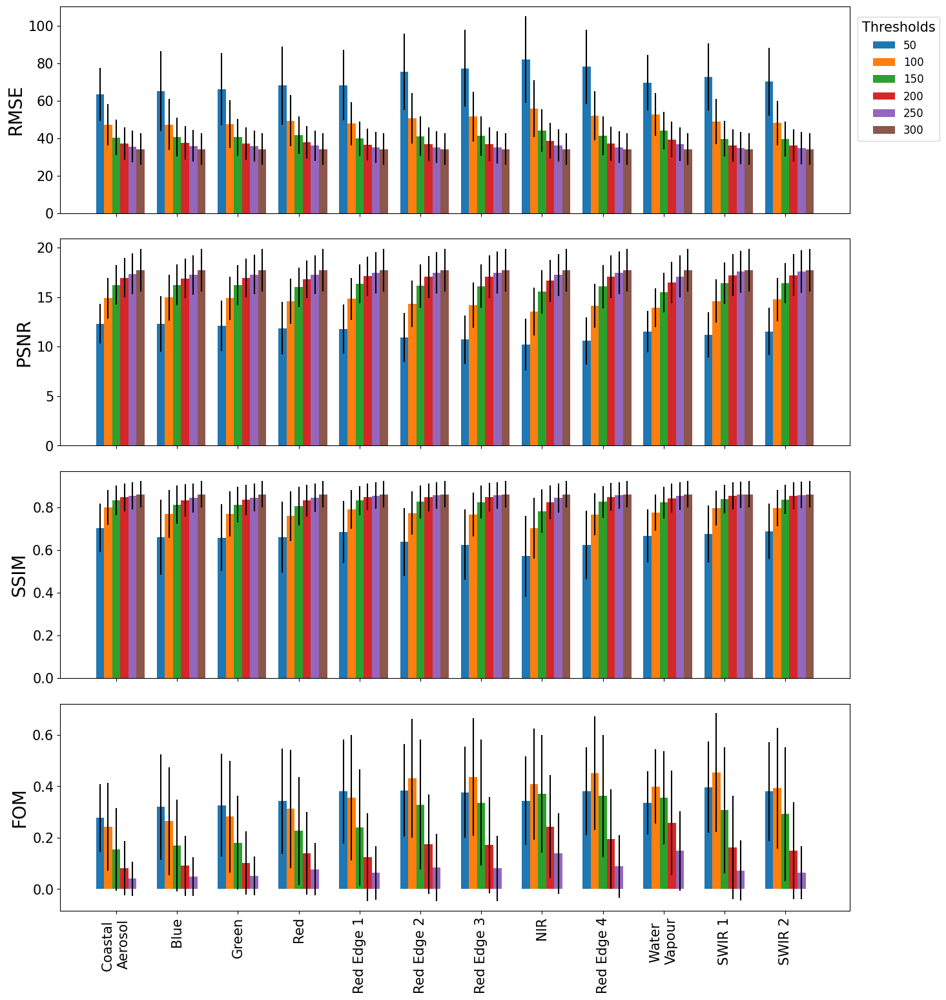

In [6]:
# --- Load Prewitt Evaluation CSV ---
df_metrics_prewitt = pd.read_csv(save_path + "\\prewitt_evaluation_metrics.csv")

# --- Add derived column: fp + fn ---
df_metrics_prewitt['fp_fn'] = df_metrics_prewitt['fp'] + df_metrics_prewitt['fn']

# --- Remove known bad IDs ---
df_metrics_prewitt_2 = df_metrics_prewitt.copy()
df_metrics_prewitt_2 = df_metrics_prewitt_2.drop(df_metrics_prewitt_2[df_metrics_prewitt_2['ID'] == 18].index)
df_metrics_prewitt_2 = df_metrics_prewitt_2.drop(df_metrics_prewitt_2[df_metrics_prewitt_2['ID'] == 41].index)
df_metrics_prewitt_2 = df_metrics_prewitt_2.drop(df_metrics_prewitt_2[df_metrics_prewitt_2['ID'] == 66].index)


df_metrics_prewitt_2['thresholds'] = df_metrics_prewitt_2['thresholds'].astype(str)


# --- Remove paths at same indices ---
test_paths_2 = test_path.copy()
path1 = test_paths_2.pop(18)
path2 = test_paths_2.pop(41 - 1)
path3 = test_paths_2.pop(66 - 2)
print(path1)
print(path2)
print(path3)

# --- Recompute inputs and edge references after filtering ---
input_2, rgb_2, labels_2, edge_reference_2 = get_input(test_paths_2)

# --- Recompute Prewitt edges on filtered inputs ---
def get_prewitt(input_images):
    prewitt_input = input_images.copy()
    prewitt = {}

    for thresh in prewitt_thresholds:  # Use same as sobel_thresholds
        results = []
        for img in prewitt_input:
            prewitt_img = processor.preprocess(img)  # Normalize bands
            out = np.zeros_like(prewitt_img)
            for i in range(12):
                band = prewitt_img[:, :, i]
                prewitt_band = processor.prewitt_ed(band)
                _, binary = cv2.threshold(prewitt_band, thresh, 255, cv2.THRESH_BINARY)
                out[:, :, i] = binary
            results.append(out)
        prewitt[str(thresh)] = results
        print(f"Threshold {thresh}: {len(results)} images processed.")
    return prewitt

prewitt_2 = get_prewitt(input_2)

# --- Convert thresholds to string format for visualizer ---
prewitt_thresholds_str = [str(t) for t in prewitt_thresholds]

# --- Initialize visualizer for Prewitt ---
viz_prewitt = utils.data_visualizer(df_metrics_prewitt_2, prewitt_2, edge_reference_2, rgb_2, prewitt_thresholds_str, channels)

# --- Plot combined trend chart for Prewitt ---
viz_prewitt.plot_combined_metric_trends(['rmse', 'psnr', 'ssim', 'fom'],
                                        save_path=save_path + "\\Figures\\prewitt_all_metrics.png")

In [7]:
# --- Filter only NIR band (band 7) ---
df_metrics_prewitt_nir = df_metrics_prewitt_2[df_metrics_prewitt_2['band'] == 7]

# --- Mean evaluation metrics per threshold ---
df_mean_prewitt = df_metrics_prewitt_nir[['thresholds', 'rmse', 'psnr', 'ssim', 'fom']].groupby('thresholds').mean().reset_index()

# Convert 'thresholds' column to integer for sorting and display
df_mean_prewitt['Threshold'] = df_mean_prewitt['thresholds'].astype(int)

# Sort and reformat
df_mean_prewitt = df_mean_prewitt.sort_values(by='Threshold')[['Threshold', 'rmse', 'psnr', 'ssim', 'fom']]
df_mean_prewitt.columns = ['Threshold', 'RMSE', 'PSNR', 'SSIM', 'FOM']
df_mean_prewitt = df_mean_prewitt.round(2)

# --- Copy to clipboard (optional) ---
df_mean_prewitt.to_clipboard(index=False)
df_mean_prewitt.head()

,Threshold,RMSE,PSNR,SSIM,FOM
5,50,77.23,10.70,0.63,0.38
0,100,51.47,14.19,0.77,0.44
1,150,41.16,16.11,0.82,0.34
2,200,36.86,17.06,0.85,0.17
3,250,35.14,17.47,0.86,0.08


In [8]:
# --- Initialize threshold count dataframe ---
best_threshold_count_prewitt = pd.DataFrame({'Threshold': prewitt_thresholds})

# --- Count the best thresholds per metric across all images ---
for metric in ['rmse', 'psnr', 'ssim', 'fom']:
    df = df_metrics_prewitt_2[['ID', 'thresholds', metric]]

    # Select best performing threshold per image
    if metric == 'rmse':
        best_thresholds = df.loc[df.groupby('ID')[metric].idxmin()]
    else:
        best_thresholds = df.loc[df.groupby('ID')[metric].idxmax()]

    # Count how many times each threshold was chosen as best
    count = []
    print(f"\nBest thresholds for {metric.upper()}:")
    for threshold in prewitt_thresholds:
        df_thresh = best_thresholds[best_thresholds['thresholds'] == str(threshold)]
        count.append(len(df_thresh))
        print(f"Threshold {threshold}: {len(df_thresh)} occurrences")

    # Add to results
    best_threshold_count_prewitt[metric.upper()] = count

# --- Copy to clipboard (optional) ---
best_threshold_count_prewitt.to_clipboard(index=False)
best_threshold_count_prewitt


Best thresholds for RMSE:
Threshold 50: 0 occurrences
Threshold 100: 0 occurrences
Threshold 150: 1 occurrences
Threshold 200: 1 occurrences
Threshold 250: 29 occurrences
Threshold 300: 64 occurrences

Best thresholds for PSNR:
Threshold 50: 0 occurrences
Threshold 100: 0 occurrences
Threshold 150: 1 occurrences
Threshold 200: 1 occurrences
Threshold 250: 29 occurrences
Threshold 300: 64 occurrences

Best thresholds for SSIM:
Threshold 50: 1 occurrences
Threshold 100: 4 occurrences
Threshold 150: 4 occurrences
Threshold 200: 11 occurrences
Threshold 250: 42 occurrences
Threshold 300: 33 occurrences

Best thresholds for FOM:
Threshold 50: 13 occurrences
Threshold 100: 41 occurrences
Threshold 150: 33 occurrences
Threshold 200: 7 occurrences
Threshold 250: 1 occurrences
Threshold 300: 0 occurrences


,Threshold,RMSE,PSNR,SSIM,FOM
0,50,0,0,1,13
1,100,0,0,4,41
2,150,1,1,4,33
3,200,1,1,11,7
4,250,29,29,42,1
5,300,64,64,33,0


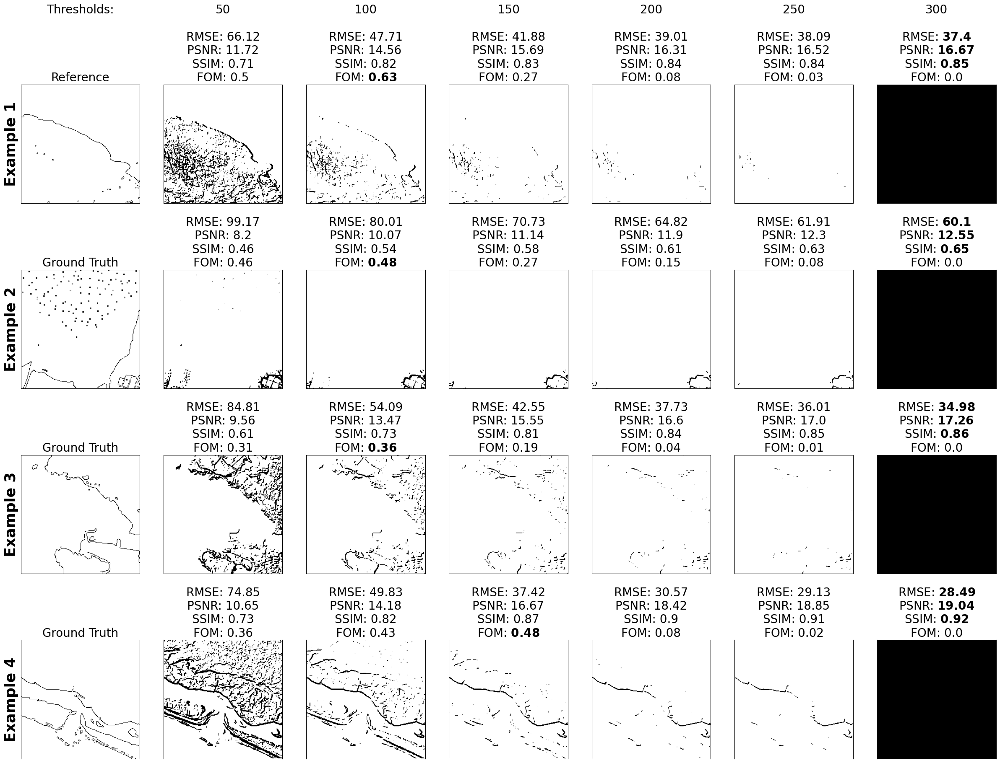

In [9]:
# --- Convert 'thresholds' column to string for matching ---
df_metrics_prewitt_2["thresholds"] = df_metrics_prewitt_2["thresholds"].astype(str)

# --- Select image IDs where FOM performs meaningfully ---
IDs = [74, 40, 2, 68]

# --- Plot and save Prewitt edge examples using the Prewitt visualizer ---
viz_prewitt.example_plots(IDs, save_path=save_path + "\\Figures\\prewitt_good_examples.png")

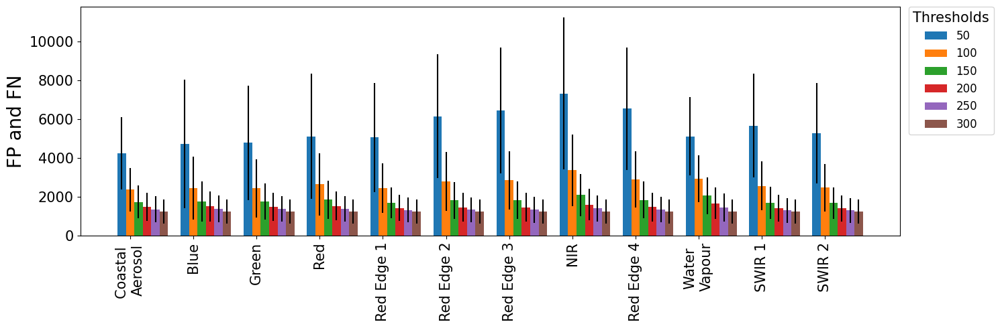

In [10]:
import importlib
importlib.reload(utils)

# --- FP + FN trend plot ---
df_metrics_prewitt_2["thresholds"] = df_metrics_prewitt_2["thresholds"].astype(str)  # Ensure type match
viz_prewitt.plot_metric_trends('fp_fn', ylabel="FP and FN", save_path=save_path + "\\Figures\\prewitt_fp_fn_sum.png")


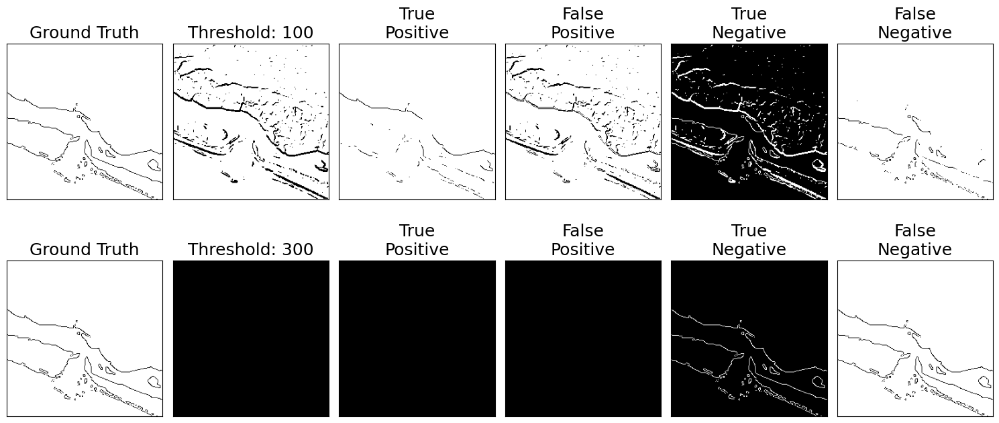

In [11]:

# --- TP/FP/TN/FN visual example ---
rint = 68
band = 7
thresholds_to_plot = [100, 300]  # Prewitt thresholds

fig, axs = plt.subplots(2, 6, figsize=(15, 7))
fig.set_facecolor('white')

for i, threshold in enumerate(thresholds_to_plot):
    reference = edge_reference_2[rint].astype(float)
    detected = prewitt_2[str(threshold)][rint][:, :, band].astype(float)

    # TP
    TP = reference - (255 - detected)
    TP[TP < 0] = 0

    # FP
    FP = detected - TP

    # TN
    TN = (255 - reference) - detected
    TN[TN < 0] = 0

    # FN
    FN = (255 - detected) - (255 - reference)
    FN[FN < 0] = 0

    # --- Plotting ---
    axs[i, 0].imshow(255 - reference, cmap="gray")
    axs[i, 0].set_title("Ground Truth", size=18)

    axs[i, 1].imshow(255 - detected, cmap="gray")
    axs[i, 1].set_title(f"Threshold: {threshold}", size=18)

    axs[i, 2].imshow(255 - TP, cmap="gray")
    axs[i, 2].set_title("True\nPositive", size=18)

    axs[i, 3].imshow(255 - FP, cmap="gray")
    axs[i, 3].set_title("False\nPositive", size=18)

    axs[i, 4].imshow(255 - TN, cmap="gray")
    axs[i, 4].set_title("True\nNegative", size=18)

    axs[i, 5].imshow(255 - FN, cmap="gray")
    axs[i, 5].set_title("False\nNegative", size=18)

for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig(save_path + "\\Figures\\prewitt_TP_FP_example.png", dpi=300)


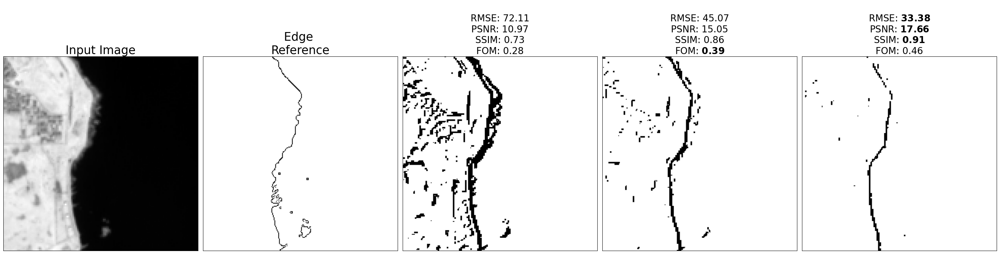

In [12]:

# --- Threshold comparison plot with metric overlays ---
fig, axs = plt.subplots(1, 5, figsize=(30, 20))
fig.set_facecolor('white')

rint = 67
thresholds = [50, 100, 150]
band = 10

img_input = input[rint].copy()

# Input image
axs[0].imshow(img_input[:, :, band], cmap="gray")
axs[0].set_title("Input Image", size=25)

# Ground truth
ref_img = edge_reference[rint]
axs[1].imshow(255 - ref_img, cmap="gray")
axs[1].set_title("Edge \nReference", size=25)

# Processor instance
processor = utils.data_processor()

# Preprocess and extract band
prewitt_input = processor.preprocess(img_input)
band_img = prewitt_input[:, :, band]

# Loop through thresholds
for i, t in enumerate(thresholds):
    prewitt_band = processor.prewitt_ed(band_img)
    _, binary_img = cv2.threshold(prewitt_band, t, 255, cv2.THRESH_BINARY)

    axs[i + 2].imshow(255 - binary_img, cmap="gray")

    # Compute metrics
    rmse_ = round(rmse(ref_img, binary_img), 2)
    psnr_ = round(psnr(ref_img, binary_img), 2)
    ssim_ = round(ssim(ref_img, binary_img, multichannel=True), 2)
    fom_ = round(processor.fom(ref_img, binary_img), 2)

    # Dynamic title
    if i == 0:
        axs[i + 2].set_title(f"\nRMSE: {rmse_}\nPSNR: {psnr_}\nSSIM: {ssim_}\nFOM: {fom_}", size=20)
    elif i == 1:
        axs[i + 2].set_title(f"\nRMSE: {rmse_}\nPSNR: {psnr_}\nSSIM: {ssim_}\nFOM: " + r"$\bf{" + str(fom_) + "}$", size=20)
    else:
        axs[i + 2].set_title(
            "\nRMSE: " + r"$\bf{" + str(rmse_) + "}$" +
            "\nPSNR: " + r"$\bf{" + str(psnr_) + "}$" +
            "\nSSIM: " + r"$\bf{" + str(ssim_) + "}$" +
            "\nFOM: " + str(fom_), size=20
        )

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig(save_path + "\\Figures\\prewitt_threshold_comparison.png", dpi=300)
plt.show()


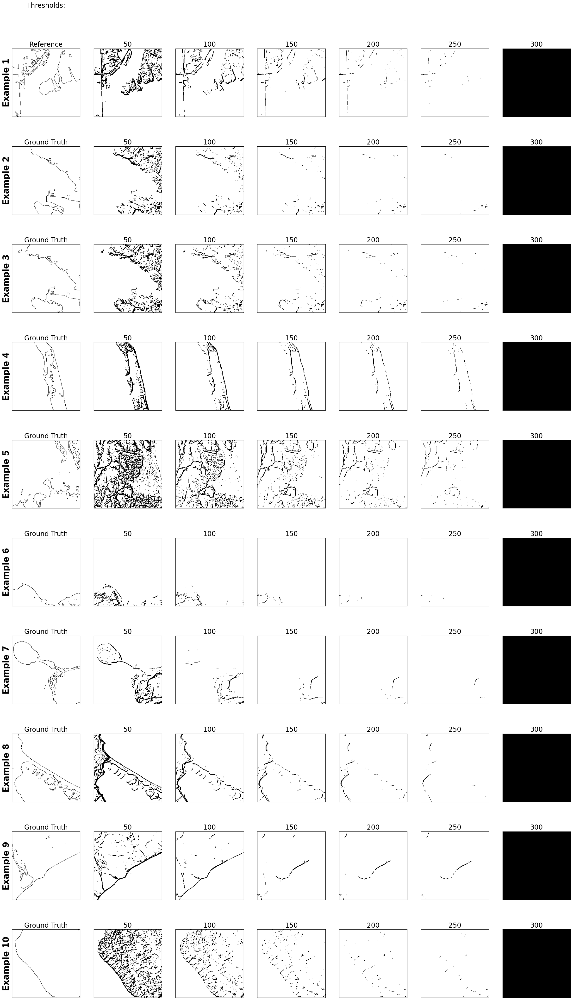

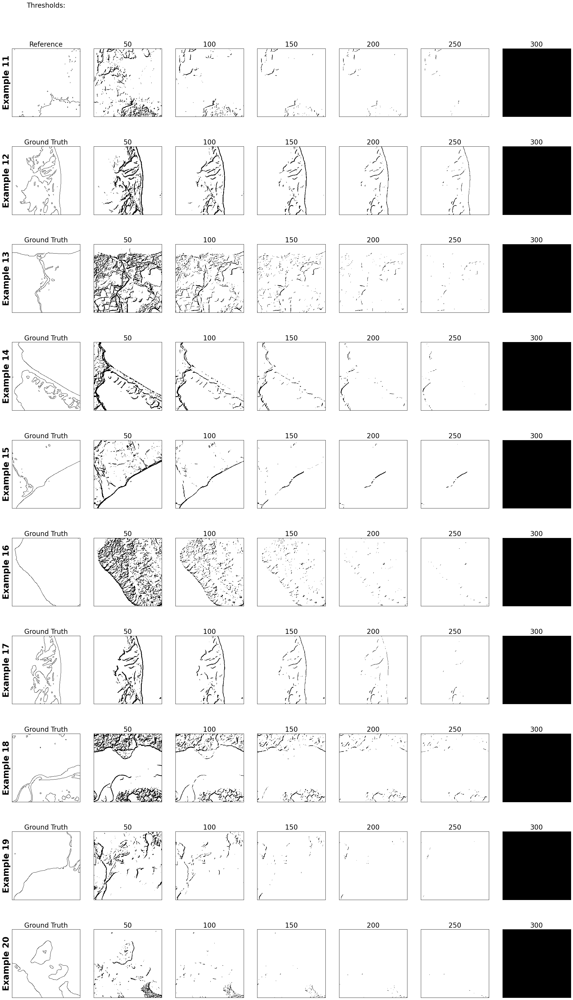

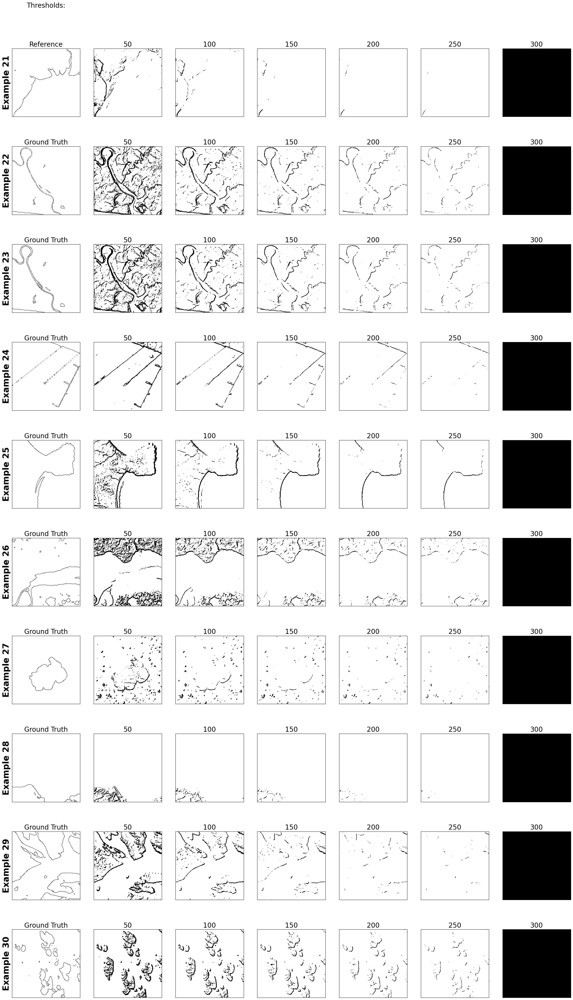

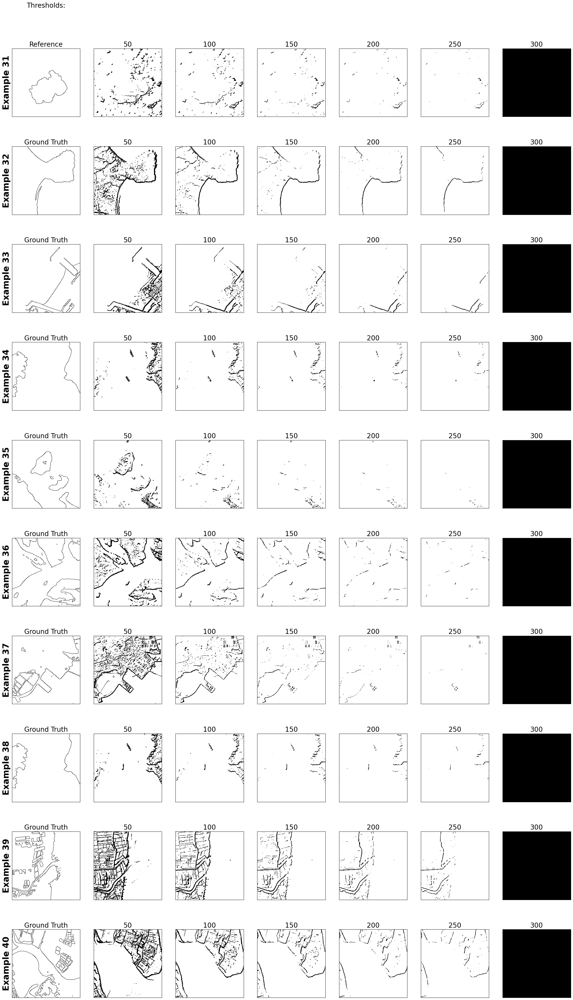

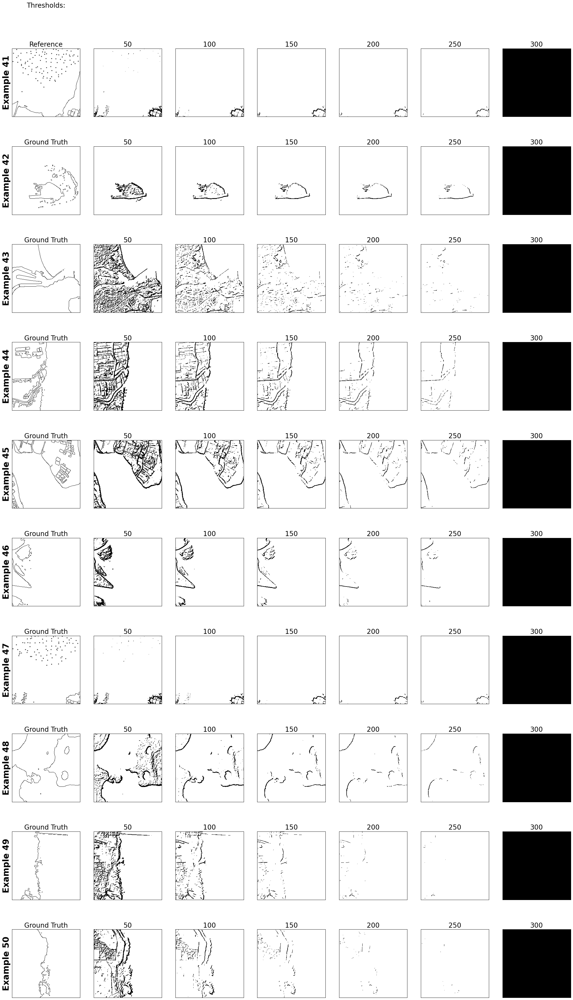

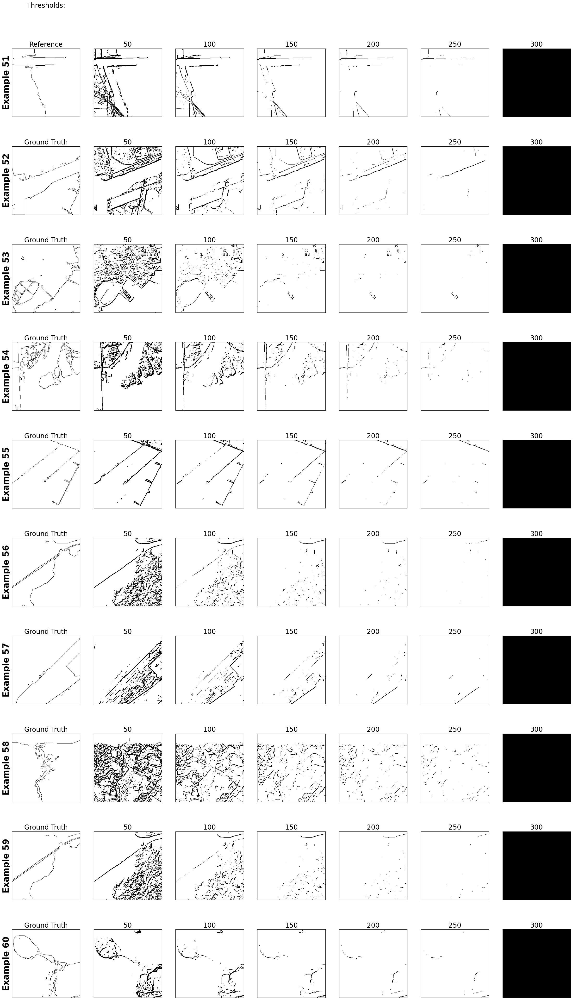

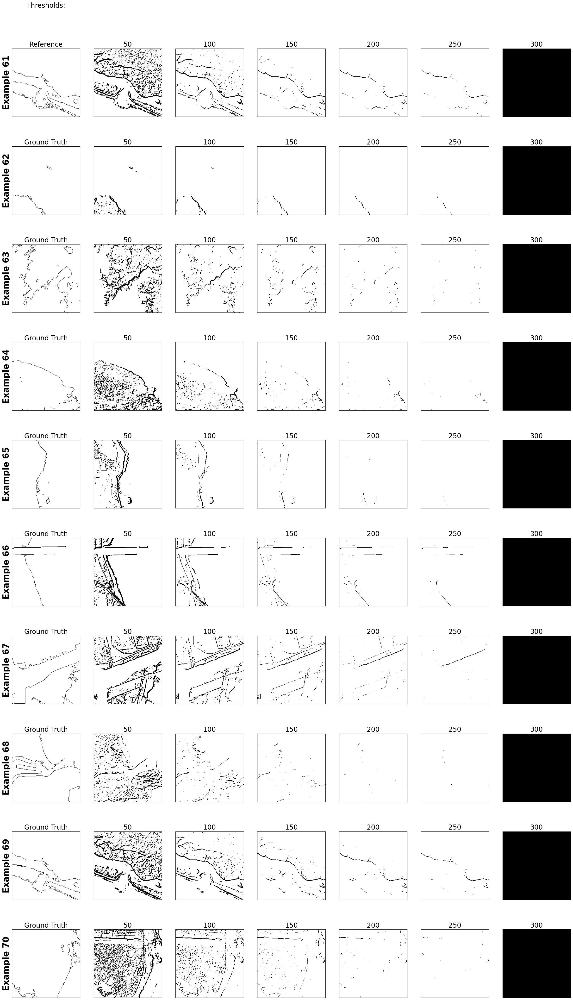

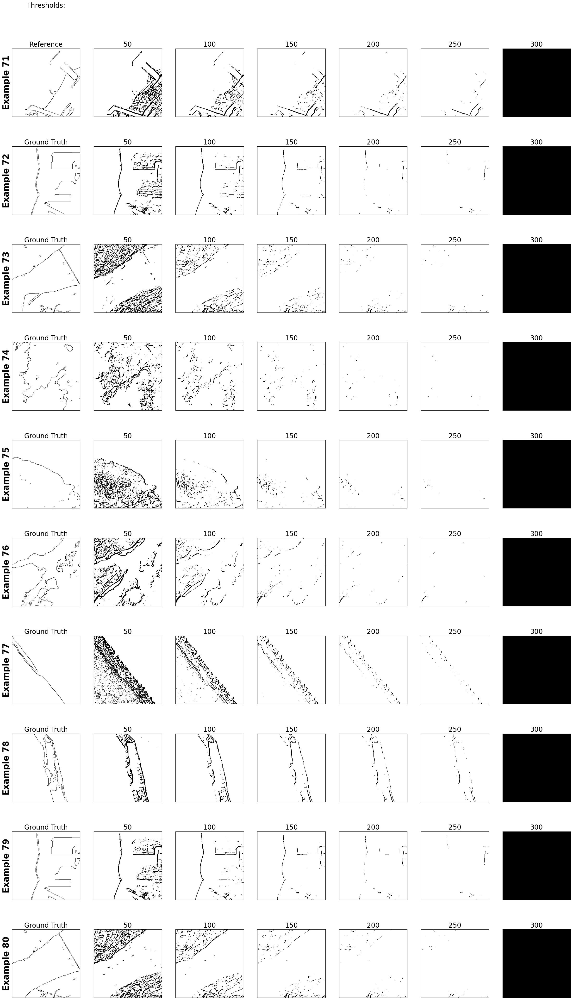

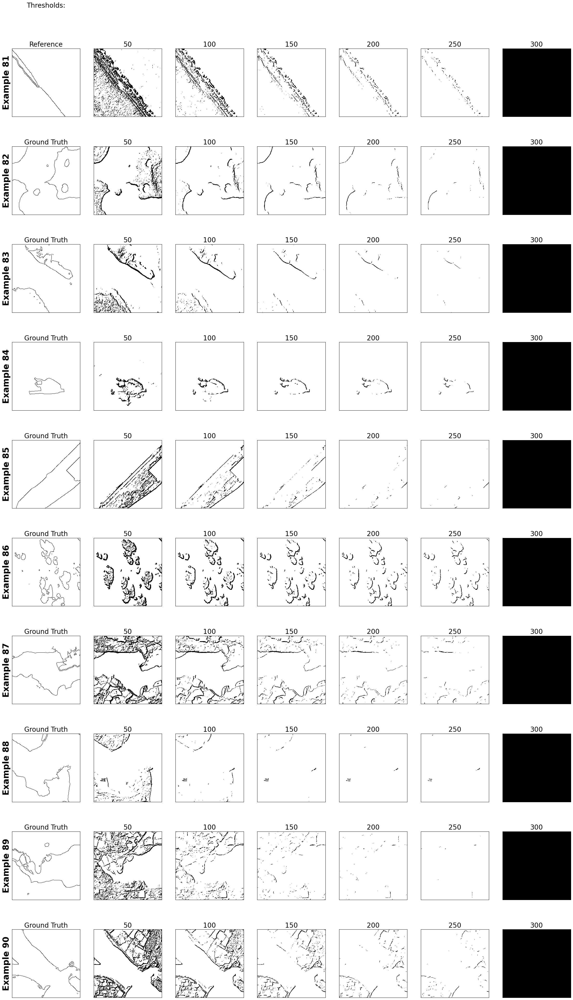

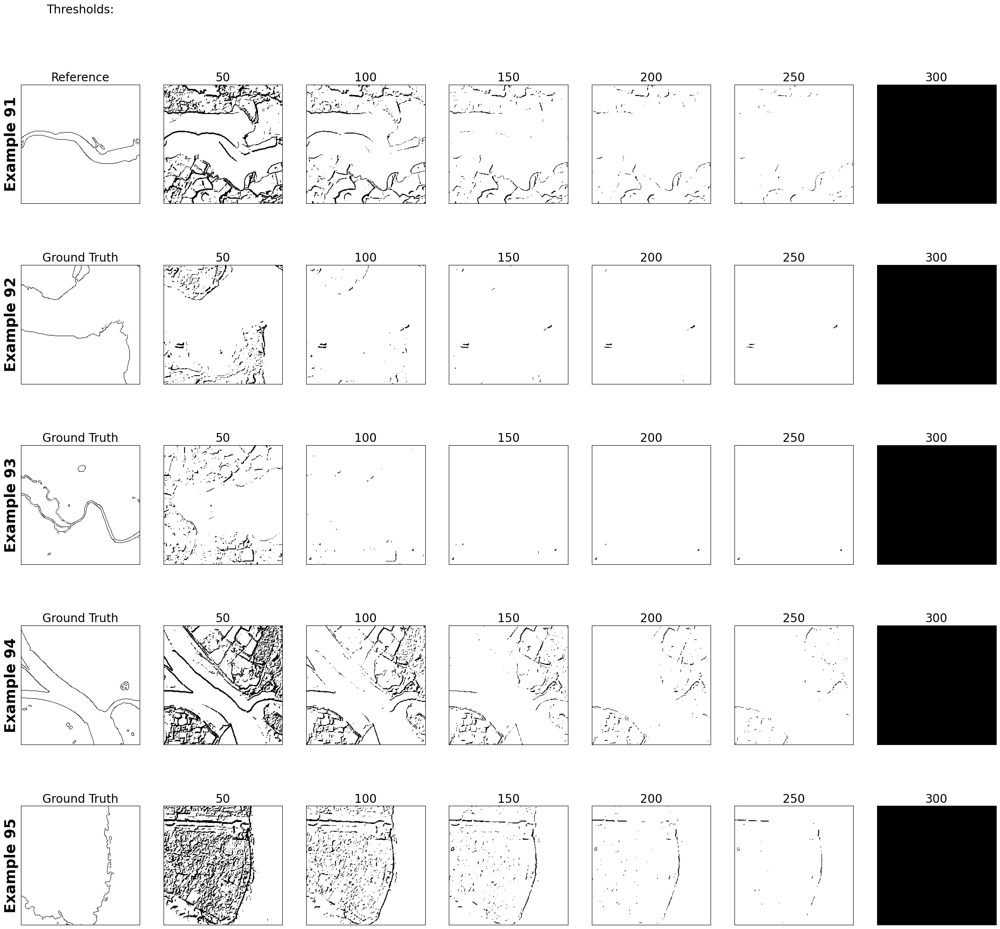

In [13]:

# --- Get image names for visual inspection ---
x = [path.split("/")[-1] for path in test_path]
df = pd.DataFrame({"ID": x})
df.to_clipboard(index=False)

'''# --- Visual inspection across image groups ---
ALL_IDS = [
    list(range(0, 10)), list(range(10, 20)), list(range(20, 30)),
    list(range(30, 40)), list(range(40, 50)), list(range(50, 60)),
    list(range(60, 70)), list(range(70, 80)), list(range(80, 90)),
    list(range(90, 98))
]

for i, IDs in enumerate(ALL_IDS):
    viz_prewitt.example_plots(IDs, ex_diff=10 * i, show_metrics=False,
                              save_path=save_path + f"\\Figures\\prewitt_group_{i+1}.png")'''

# Recalculate ALL_IDS based on actual filtered dataset size
num_images = len(test_paths_2)  # Should be 95 after removing 3
group_size = 10

ALL_IDS = [list(range(i, min(i + group_size, num_images))) for i in range(0, num_images, group_size)]
for i, IDs in enumerate(ALL_IDS):
    viz_prewitt.example_plots(IDs, ex_diff=10 * i, show_metrics=False,
                          save_path=save_path + f"\\Figures\\prewitt_group_{i+1}.png")